In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('international.csv')

In [3]:
columns_to_keep = ['Title', 'Publication Year', 'Publication Type', 'Source Title', 'Abstract',
                   'Fields of Study', 'Citing Patents Count', 'Citing Works Count']
df = df[columns_to_keep]
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13884 entries, 0 to 13883
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Title                 13884 non-null  object 
 1   Publication Year      13834 non-null  float64
 2   Publication Type      13884 non-null  object 
 3   Source Title          13884 non-null  object 
 4   Abstract              10072 non-null  object 
 5   Fields of Study       12349 non-null  object 
 6   Citing Patents Count  13884 non-null  int64  
 7   Citing Works Count    13884 non-null  int64  
dtypes: float64(1), int64(2), object(5)
memory usage: 867.9+ KB


In [4]:
df = df.dropna()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9654 entries, 4 to 13877
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Title                 9654 non-null   object 
 1   Publication Year      9654 non-null   float64
 2   Publication Type      9654 non-null   object 
 3   Source Title          9654 non-null   object 
 4   Abstract              9654 non-null   object 
 5   Fields of Study       9654 non-null   object 
 6   Citing Patents Count  9654 non-null   int64  
 7   Citing Works Count    9654 non-null   int64  
dtypes: float64(1), int64(2), object(5)
memory usage: 678.8+ KB


In [5]:
#df = df[df["Citing Patents Count"] == 0]

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9654 entries, 4 to 13877
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Title                 9654 non-null   object 
 1   Publication Year      9654 non-null   float64
 2   Publication Type      9654 non-null   object 
 3   Source Title          9654 non-null   object 
 4   Abstract              9654 non-null   object 
 5   Fields of Study       9654 non-null   object 
 6   Citing Patents Count  9654 non-null   int64  
 7   Citing Works Count    9654 non-null   int64  
dtypes: float64(1), int64(2), object(5)
memory usage: 678.8+ KB


In [7]:
df["Publication Year"] = df["Publication Year"].values.astype(int)
# Introducing temporal ordering
#df["Publication Year"] = pd.to_datetime(df["Publication Year"])
df = df.sort_values(by="Publication Year")

In [8]:
df = df.drop(df[(df['Abstract'] == 'n/') | (df['Abstract'] == "")].index)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9650 entries, 11888 to 1951
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Title                 9650 non-null   object
 1   Publication Year      9650 non-null   int32 
 2   Publication Type      9650 non-null   object
 3   Source Title          9650 non-null   object
 4   Abstract              9650 non-null   object
 5   Fields of Study       9650 non-null   object
 6   Citing Patents Count  9650 non-null   int64 
 7   Citing Works Count    9650 non-null   int64 
dtypes: int32(1), int64(2), object(5)
memory usage: 640.8+ KB


In [10]:
pd.set_option('display.max_rows', df.shape[0]+1)
pd.set_option('display.max_columns',df.shape[1]+1)
pd.set_option('display.width', 1000)
pd.set_option('display.max_colwidth', None)

In [11]:
interesting_years = [1911, 1912, 1916, 1918, 1919, 1920,
       1921, 1922, 1924, 1925, 1926, 1927, 1928, 1929, 1930, 1931,
       1932, 1933, 1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942,
       1943, 1944, 1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953,
       1954, 1955, 1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964,
       1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975,
       1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986,
       1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997,
       1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008,
       2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019,
       2020, 2021]
interesting_years.sort()

In [12]:
len(interesting_years)

106

<AxesSubplot:xlabel='Publication Year'>

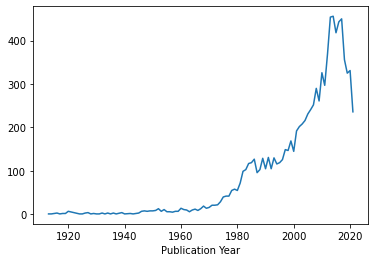

In [13]:
df.groupby('Publication Year').count()['Title'].plot()

<AxesSubplot:xlabel='Publication Year'>

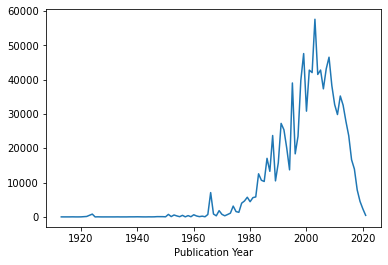

In [14]:
df.groupby('Publication Year').sum()['Citing Works Count'].plot()

In [15]:
import heapq
import re # regular expressions
import nltk
import string
nltk.download('punkt')
nltk.download('stopwords')
stopwords = nltk.corpus.stopwords.words('english')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\carus\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\carus\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [16]:
def preprocess(text):
    formatted_text = text.lower()
    tokens = []
    for token in nltk.word_tokenize(formatted_text):
        tokens.append(token)
    
    #print(tokens)
    tokens = [word for word in tokens if word not in stopwords and word not in string.punctuation]
    formatted_text = ' '.join(element for element in tokens)
    return formatted_text

In [17]:
df["Abstract"] = df["Abstract"].apply(preprocess)

In [18]:
counts = df.groupby('Publication Year').count()['Title'].values
place_holder = [None]*(len(counts)+1)
place_holder[0] = 0
for i in range(1,len(counts)+1):
    place_holder[i] = place_holder[i-1] + counts[i-1]

In [19]:
len(counts)

104

In [20]:
len(df['Publication Year'].unique())

104

In [21]:
df = df.drop(df[(df['Abstract'] == 'n/') | (df['Abstract'] == "")].index)

In [22]:
df[(df['Abstract'] == 'n/') | (df['Abstract'] == "")].index

Int64Index([], dtype='int64')

In [23]:
df['Publication Year'].unique()

array([1913, 1914, 1916, 1917, 1918, 1919, 1920, 1922, 1924, 1925, 1926,
       1927, 1928, 1929, 1930, 1931, 1932, 1933, 1934, 1935, 1936, 1937,
       1939, 1940, 1942, 1943, 1944, 1945, 1946, 1947, 1948, 1949, 1950,
       1951, 1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1960, 1961,
       1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972,
       1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983,
       1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994,
       1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005,
       2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016,
       2017, 2018, 2019, 2020, 2021])

In [24]:
df['Publication Year'].value_counts() 

2014    456
2013    454
2017    450
2016    443
2015    418
2012    370
2018    356
2020    331
2010    326
2019    325
2011    297
2008    290
2009    261
2007    252
2006    241
2021    236
2005    231
2004    216
2003    208
2002    202
2001    192
1999    169
1997    149
1998    147
2000    145
1991    131
1993    130
1989    129
1986    127
1996    126
1995    119
1985    119
1984    117
1994    116
1992    105
1990    105
1988    103
1983    103
1982     99
1987     96
1981     72
1979     58
1980     55
1978     55
1977     42
1976     42
1975     40
1974     29
1973     22
1971     21
1972     21
1968     19
1970     16
1969     14
1960     14
1952     13
1967     13
1965     12
1954     11
1961     11
1962     10
1964     10
1951      9
1966      9
1947      8
1949      8
1950      8
1953      7
1946      7
1920      7
1959      7
1958      7
1948      7
1955      6
1963      6
1956      6
1957      5
1922      4
1927      4
1939      4
1945      3
1936      3
1934      3
1926

In [25]:
interesting_years = [1916, 1918, 1919, 1920, 1922, 1926,
       1927, 1929, 1932, 1934, 1936,
       1939, 1942, 1944, 1945, 1946, 1947, 1948, 1949, 1950,
       1951, 1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1960, 1961,
       1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972,
       1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983,
       1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994,
       1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005,
       2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016,
       2017, 2018, 2019, 2020, 2021]
interesting_years.sort()

In [55]:
recent_years = [2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008,
               2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020]
df_recent = df[df['Publication Year'].isin(recent_years)]

In [56]:
percentage_high = 0.95
percentage_low = 0.015 # 1% or 1.5% is probably better

In [57]:
# Applying TFIDF to titles
#You can still get n-grams here
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
vectorizer_abstracts = TfidfVectorizer(ngram_range = (2, 2), max_df = percentage_high, min_df = percentage_low)
abstracts_tfidf = vectorizer_abstracts.fit_transform(df_recent["Abstract"])
scores = (abstracts_tfidf.toarray())
#print("\n\nScores : \n", scores)

In [58]:
tf_idf_abstracts = pd.DataFrame(data=abstracts_tfidf.toarray(),columns=vectorizer_abstracts.get_feature_names())
tf_idf_abstracts.shape

(6464, 78)

In [59]:
tf_idf_abstracts.columns

Index(['abstract paper', 'abstract study', 'across countries', 'also find', 'also show', 'business cycle', 'capital flows', 'central bank', 'country specific', 'cross border', 'cross country', 'current account', 'data set', 'developing countries', 'direct investment', 'economic growth', 'emerging market', 'emerging markets', 'empirical evidence', 'empirical results', 'equilibrium model', 'et al', 'euro area', 'exchange rate', 'exchange rates', 'financial crisis', 'financial markets', 'find evidence', 'find strong', 'firm level', 'foreign direct', 'foreign exchange', 'general equilibrium', 'global financial', 'human capital', 'important role', 'interest rate', 'interest rates', 'international capital', 'international financial', 'international trade', 'labor market', 'level data', 'long run', 'long term', 'monetary policy', 'oecd countries', 'open economy', 'panel data', 'paper analyzes', 'paper develops', 'paper examines', 'paper investigates', 'paper presents', 'paper provides',
     



Most relevant bi-grams 
                        term        rank
23           exchange rates  397.852285
0            abstract paper  395.099696
40               level data  231.118073
45             open economy  214.850083
43          monetary policy  167.604648
51           paper presents  150.267203
24         financial crisis  149.482937
36    international capital  143.213720
13     developing countries  142.652184
2          across countries  140.988978
32         global financial  132.480477
27               firm level  131.596247
62               small open  129.396112
25        financial markets  127.132013
10            cross country  122.386570
37  international financial  118.698596
59          results suggest  117.979272
29         foreign exchange  116.715854
18       empirical evidence  110.830172
5             capital flows  110.754059
47           paper analyzes  106.949575
41                 long run  106.690161
15          economic growth  106.555350
1            

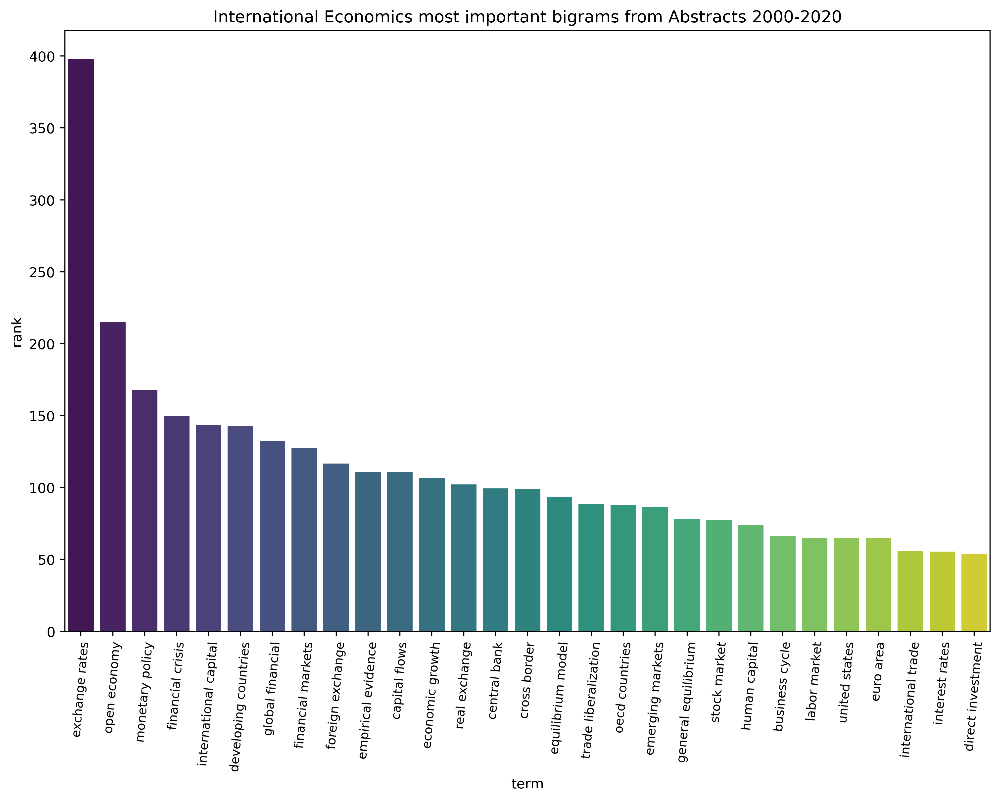

In [60]:
# Getting top ranking features
sums = abstracts_tfidf.sum(axis = 0)
data1 = []
for col, term in enumerate(features_abstracts):
    data1.append((term, sums[0, col]))
ranking = pd.DataFrame(data1, columns = ['term', 'rank'])
words = (ranking.sort_values('rank', ascending = False))
print("\n\nMost relevant bi-grams \n", words.head(50))
plt.figure(figsize=(12,8), dpi=400)
sns.barplot(x="term", y="rank", data=ranking.loc[ranking['term'].isin(['business cycle', 'capital flows', 'central bank', 
'cross border', 'developing countries',
'direct investment', 'economic growth', 'emerging markets', 'empirical evidence',
'equilibrium model', 'euro area', 'exchange rates', 
'financial crisis', 'financial markets',  
'foreign exchange', 'general equilibrium', 'global financial', 'human capital', 'interest rates', 
'international capital', 'international trade', 'labor market', 'monetary policy',
'oecd countries', 'open economy','real exchange', 
'sovereign debt', 'statistically significant', 'stock market', 'trade costs', 'trade liberalization', 
'united states'])].sort_values('rank', ascending = False), palette = 'viridis')
plt.title("International Economics most important bigrams from Abstracts 2000-2020")
plt.xticks(fontsize=9, rotation=85);
plt.yticks(fontsize=10);

In [29]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
import scipy.sparse as sparse
import networkx as nx

In [30]:
percentage_high = 0.95
percentage_low = 0.015 # 1% or 1.5% is probably better

In [31]:
# Getting bigrams from abstracts
vectorizer_abstracts = CountVectorizer(ngram_range =(2, 2), max_df = percentage_high, min_df = percentage_low)
X_titles = vectorizer_abstracts.fit_transform(df["Abstract"]) 
features_abstracts = (vectorizer_abstracts.get_feature_names())
#print("\n\nX_titles : \n", X_titles.toarray())

In [32]:
# Applying TFIDF to titles
#You can still get n-grams here
vectorizer_abstracts = TfidfVectorizer(ngram_range = (2, 2), max_df = percentage_high, min_df = percentage_low)
abstracts_tfidf = vectorizer_abstracts.fit_transform(df["Abstract"])
scores = (abstracts_tfidf.toarray())
#print("\n\nScores : \n", scores)



Most relevant bi-grams 
                      term        rank
0          abstract paper  713.284391
22          exchange rate  706.317952
38    international trade  433.120583
71          united states  363.173826
23         exchange rates  322.197096
43        monetary policy  288.779380
41               long run  265.930111
49         paper examines  264.400467
34          interest rate  222.587213
31    general equilibrium  210.326130
35         interest rates  209.679096
13   developing countries  205.374661
2        across countries  189.233910
29       foreign exchange  185.952671
56          real exchange  180.752297
45           open economy  180.595967
59        results suggest  168.060549
70            two country  160.936782
11        current account  160.052979
18     empirical evidence  156.169527
26          find evidence  153.058329
50     paper investigates  151.643307
72             using data  149.796879
10          cross country  149.051847
4          business cyc

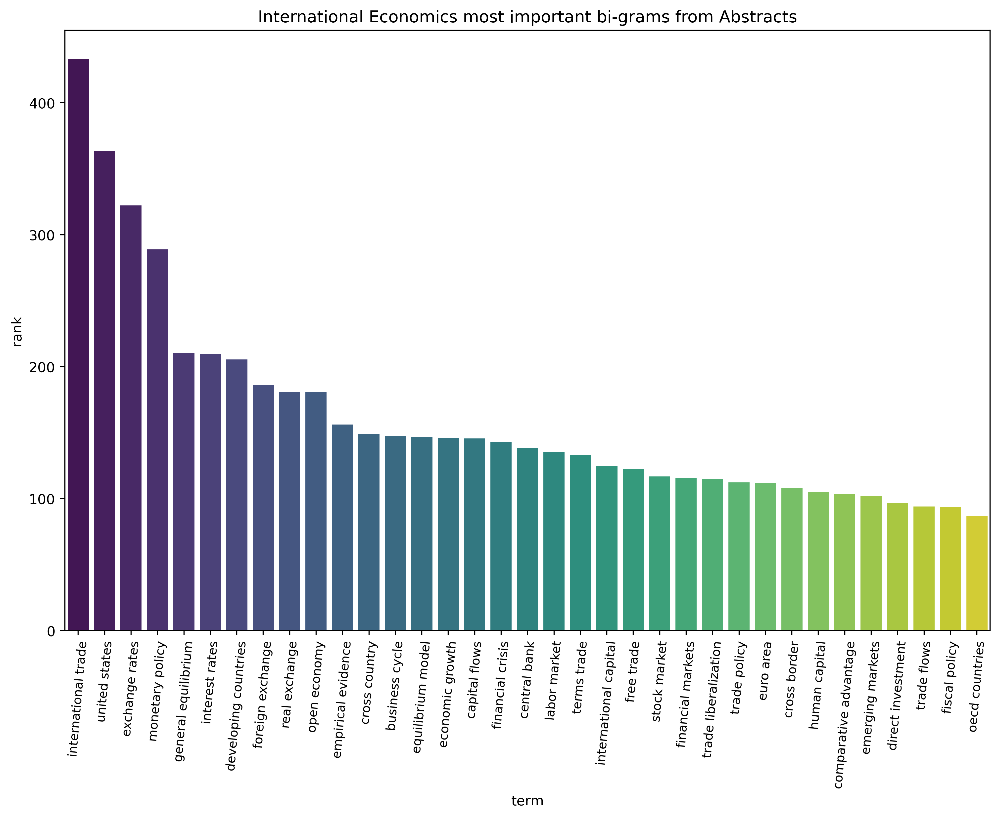

In [33]:
 # Getting top ranking features
sums = abstracts_tfidf.sum(axis = 0)
data1 = []
for col, term in enumerate(features_abstracts):
    data1.append((term, sums[0, col]))
ranking = pd.DataFrame(data1, columns = ['term', 'rank'])
words = (ranking.sort_values('rank', ascending = False))
print("\n\nMost relevant bi-grams \n", words.head(50))
plt.figure(figsize=(12,8), dpi=400)
sns.barplot(x="term", y="rank", data=ranking.loc[ranking['term'].isin(['business cycle','capital flows','central bank',
       'comparative advantage','cross border','cross country',
       'developing countries', 'direct investment', 'economic growth','emerging markets', 'empirical evidence','equilibrium model', 
       'euro area', 'exchange rates', 'financial crisis','financial markets',
       'fiscal policy', 'foreign exchange', 'free trade',
       'general equilibrium', 'human capital','interest rates', 'international capital',
       'international trade', 'labor market','monetary policy',
       'oecd countries', 'open economy','real exchange',
       'stock market', 'terms trade','trade flows', 'trade liberalization', 'trade policy','united states'])].sort_values('rank', ascending = False), palette = 'viridis')
plt.title("International Economics most important bi-grams from Abstracts")
plt.xticks(fontsize=9, rotation=85);
plt.yticks(fontsize=10);

In [34]:
ranking['term'].unique()

array(['abstract paper', 'abstract study', 'across countries',
       'also find', 'business cycle', 'capital flows', 'central bank',
       'comparative advantage', 'country specific', 'cross border',
       'cross country', 'current account', 'data set',
       'developing countries', 'direct investment', 'economic growth',
       'emerging market', 'emerging markets', 'empirical evidence',
       'empirical results', 'equilibrium model', 'euro area',
       'exchange rate', 'exchange rates', 'financial crisis',
       'financial markets', 'find evidence', 'firm level',
       'fiscal policy', 'foreign exchange', 'free trade',
       'general equilibrium', 'global financial', 'human capital',
       'interest rate', 'interest rates', 'international capital',
       'international financial', 'international trade', 'labor market',
       'level data', 'long run', 'long term', 'monetary policy',
       'oecd countries', 'open economy', 'panel data', 'paper analyzes',
       'paper deve

In [35]:
ranking.loc[ranking['term'].isin(['business cycle','capital flows','central bank',
       'comparative advantage','cross border','cross country',
       'developing countries', 'direct investment', 'economic growth','emerging markets', 'empirical evidence','equilibrium model', 
       'euro area', 'exchange rates', 'financial crisis','financial markets',
       'fiscal policy', 'foreign exchange', 'free trade',
       'general equilibrium', 'human capital','interest rates', 'international capital',
       'international trade', 'labor market','monetary policy',
       'oecd countries', 'open economy','real exchange',
       'stock market', 'terms trade','trade flows', 'trade liberalization', 'trade policy','united states'])].sort_values('rank', ascending = False)

,term,rank
38,international trade,433.120583
71,united states,363.173826
23,exchange rates,322.197096
43,monetary policy,288.779380
31,general equilibrium,210.326130
35,interest rates,209.679096
13,developing countries,205.374661
29,foreign exchange,185.952671
56,real exchange,180.752297
45,open economy,180.595967


In [36]:
#tf_idf_abstracts = pd.DataFrame.sparse.from_spmatrix(abstracts_tfidf, columns=vectorizer_abstracts.get_feature_names())
tf_idf_abstracts = pd.DataFrame(data=abstracts_tfidf.toarray(),columns=vectorizer_abstracts.get_feature_names())
tf_idf_abstracts.shape

(9650, 73)

In [37]:
tf_idf_abstracts.columns

Index(['abstract paper', 'abstract study', 'across countries', 'also find', 'business cycle', 'capital flows', 'central bank', 'comparative advantage', 'country specific', 'cross border', 'cross country', 'current account', 'data set', 'developing countries', 'direct investment', 'economic growth', 'emerging market', 'emerging markets', 'empirical evidence', 'empirical results', 'equilibrium model', 'euro area', 'exchange rate', 'exchange rates', 'financial crisis', 'financial markets', 'find evidence', 'firm level', 'fiscal policy', 'foreign exchange', 'free trade', 'general equilibrium', 'global financial', 'human capital', 'interest rate', 'interest rates', 'international capital', 'international financial', 'international trade', 'labor market', 'level data', 'long run', 'long term', 'monetary policy', 'oecd countries', 'open economy', 'panel data', 'paper analyzes', 'paper develops', 'paper examines', 'paper investigates', 'paper presents', 'paper provides', 'paper shows',
       

In [38]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_X = scaler.fit_transform(tf_idf_abstracts)

In [39]:
from sklearn.decomposition import PCA

In [40]:
explained_variance = []

for n in range(1,tf_idf_abstracts.shape[1]+1):
    pca = PCA(n_components=n)
    pca.fit(scaled_X)
    explained_variance.append(np.sum(pca.explained_variance_ratio_))

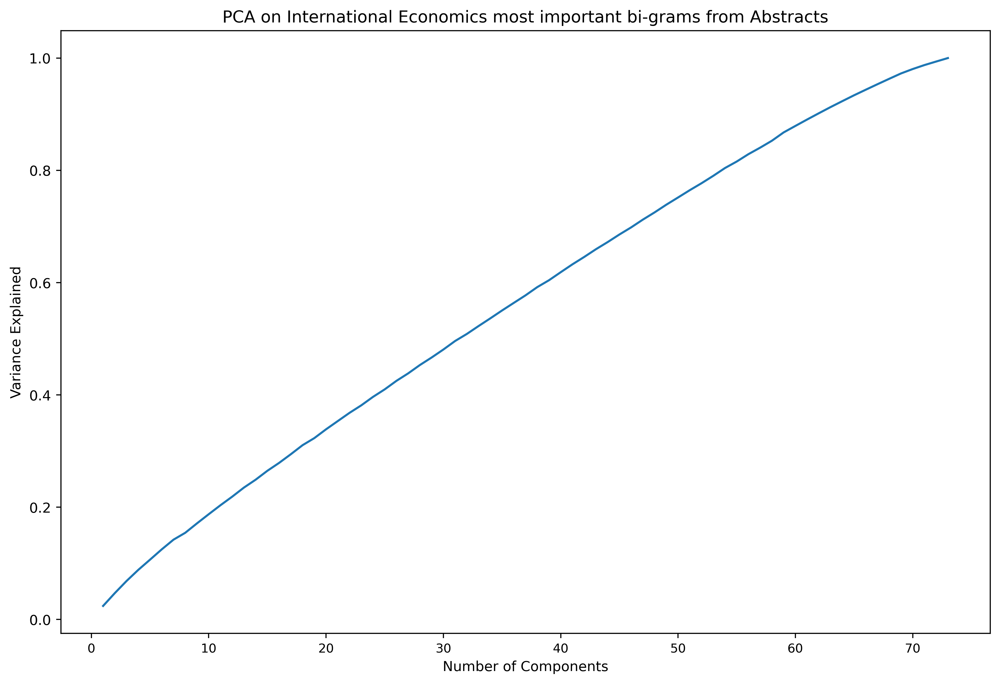

In [41]:
plt.figure(figsize=(12,8), dpi=400)
plt.plot(range(1,tf_idf_abstracts.shape[1]+1),explained_variance)
plt.title("PCA on International Economics most important bi-grams from Abstracts")
plt.xticks(fontsize=9);
plt.yticks(fontsize=10);
plt.xlabel("Number of Components")
plt.ylabel("Variance Explained");

In [42]:
interesting_columns = ['business cycle','capital flows','central bank',
       'comparative advantage','cross border','cross country',
       'developing countries', 'direct investment', 'economic growth','emerging markets', 'empirical evidence','equilibrium model', 
       'euro area', 'exchange rates', 'financial crisis','financial markets',
       'fiscal policy', 'foreign exchange', 'free trade',
       'general equilibrium', 'human capital','interest rates', 'international capital',
       'international trade', 'labor market','monetary policy',
       'oecd countries', 'open economy','real exchange',
       'stock market', 'terms trade','trade flows', 'trade liberalization', 'trade policy','united states']

In [43]:
tf_idf_abstracts = tf_idf_abstracts[interesting_columns]
tf_idf_abstracts.shape

(9650, 35)

{'1': Text(0.17739389103542647, 0.21079321260156522, '1'),
 '2': Text(-0.06180329915819577, -0.006447842657443419, '2'),
 '3': Text(-0.49622459036814237, -0.17917196679386624, '3'),
 '4': Text(0.20090775753399, 0.029089902999628343, '4'),
 '5': Text(-0.1322674996816489, 0.2009052234502571, '5'),
 '6': Text(0.8384912744453907, -0.25067904548866454, '6'),
 '7': Text(0.9418413251174844, 0.3110463930732466, '7'),
 '8': Text(0.050267938652617715, 0.24461055924149597, '8'),
 '9': Text(-0.1656182985369331, 0.35639202253259694, '9'),
 '10': Text(0.35040940665138565, -0.2612215440609255, '10'),
 '11': Text(-0.17216856772041023, 1.0, '11'),
 '12': Text(-0.9510380490102339, 0.2702504911637964, '12'),
 '13': Text(-0.13928407888147493, -0.27437408971503846, '13'),
 '14': Text(-0.4399790961188685, 0.28268932251786544, '14'),
 '15': Text(-0.009839021492054111, -0.28901818154720615, '15'),
 '16': Text(-0.6784953402883994, -0.30221309701697935, '16'),
 '17': Text(-0.10222800498370709, 0.554046395113284

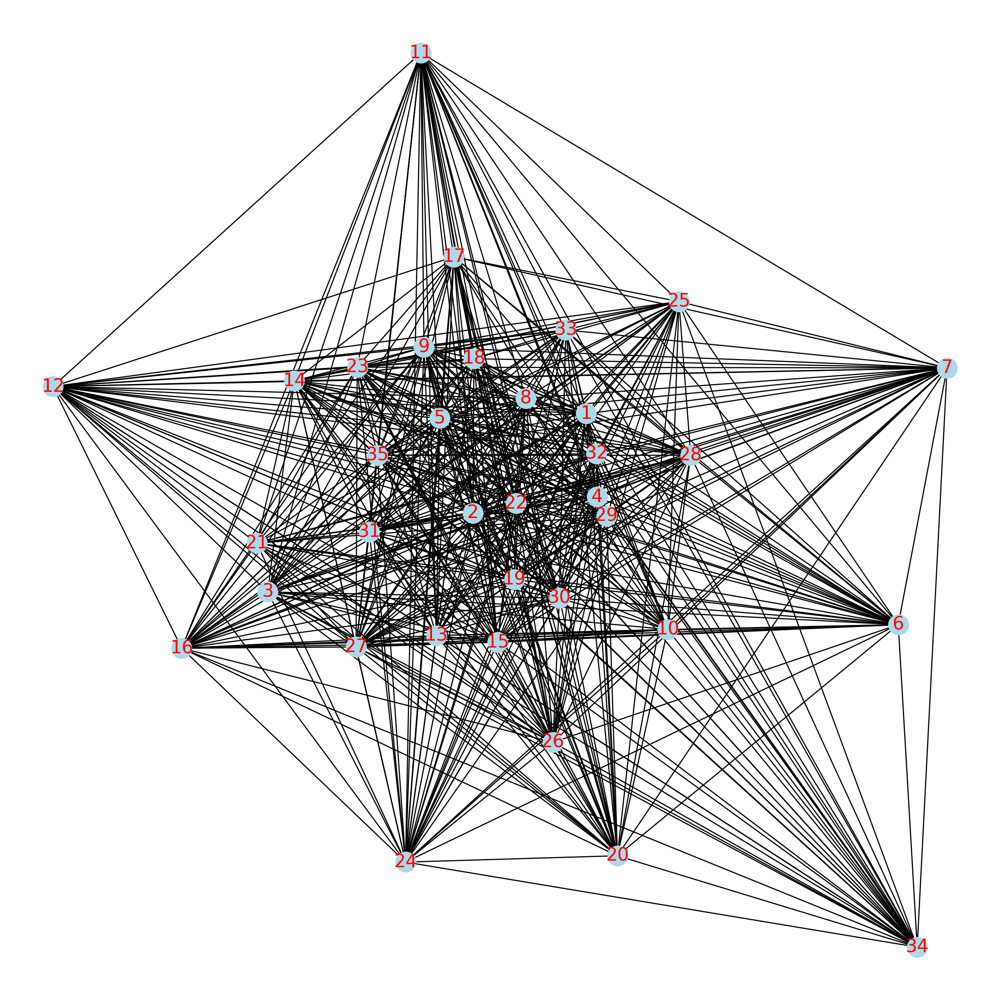

In [44]:
tf_idf_abstracts_2 = tf_idf_abstracts.rename({'business cycle':'1','capital flows':'2','central bank':'3',
                                              'comparative advantage':'4',
                                              'cross border':'5','cross country':'6','developing countries':'7', 
                                              'direct investment':'8','economic growth':'9','emerging markets':'10',
                                              'empirical evidence':'11','equilibrium model':'12', 
                                              'euro area':'13', 'exchange rates':'14', 'financial crisis':'15',
                                              'financial markets':'16','fiscal policy':'17', 'foreign exchange':'18', 
                                              'free trade':'19','general equilibrium':'20', 'human capital':'21',
                                              'interest rates':'22', 'international capital':'23','international trade':'24',
                                              'labor market':'35','monetary policy':'25','oecd countries':'26', 
                                              'open economy':'27','real exchange':'28','stock market':'29', 
                                              'terms trade':'30','trade flows':'31', 'trade liberalization':'32', 
                                              'trade policy':'33','united states':'34'}, axis='columns')
meta_matrix = tf_idf_abstracts_2.transpose().dot(tf_idf_abstracts_2)
G=nx.from_pandas_adjacency(meta_matrix)
plt.figure(figsize=(12,12), dpi=200)
nx.draw(G, pos=nx.kamada_kawai_layout(G), node_color='lightblue')
#nx.draw_networkx_nodes(G, pos=nx.kamada_kawai_layout(G), node_color="tab:red")
nx.draw_networkx_labels(G, pos=nx.kamada_kawai_layout(G), font_size=16, font_color="red")

In [45]:
centrality_time_series = []
count = 0 

# andare di anno in anno
for i in range(0, len(place_holder)-1):
    if(place_holder[i+1]-place_holder[i] > 1):
        count += 1
        meta_matrix = tf_idf_abstracts.iloc[place_holder[i]:place_holder[i+1]+1,:].transpose().dot(tf_idf_abstracts.iloc[place_holder[i]:place_holder[i+1]+1,:])
        G=nx.from_pandas_adjacency(meta_matrix)
        centrality_time_series = centrality_time_series + list(nx.degree_centrality(G).values())
        #clustering_time_series = clustering_time_series + list(nx.clustering(G).values())

In [46]:
centrality_time_series = np.reshape(centrality_time_series,(count,tf_idf_abstracts.shape[1]))
df_centrality_time_series = pd.DataFrame(data=centrality_time_series, columns=interesting_columns)
df_centrality_time_series['year'] = ""
df_centrality_time_series['year'] = interesting_years
#df_centrality_time_series.to_csv('centrality_time_series_abstracts_bigrams_international.csv')

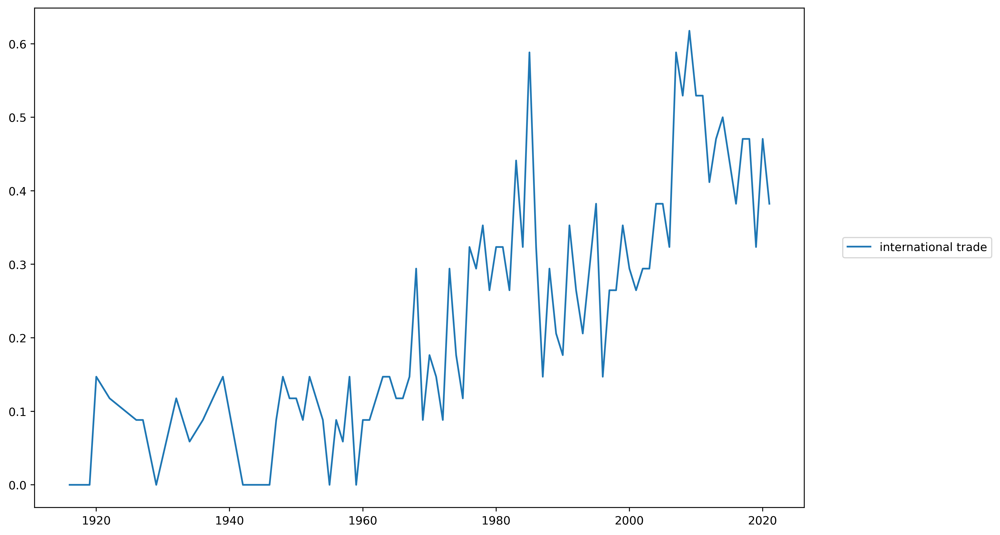

In [47]:
plt.figure(figsize=(12,8), dpi=400)
plt.plot(df_centrality_time_series['year'],df_centrality_time_series['international trade'], label = "international trade")
plt.legend(loc=(1.05,0.5))

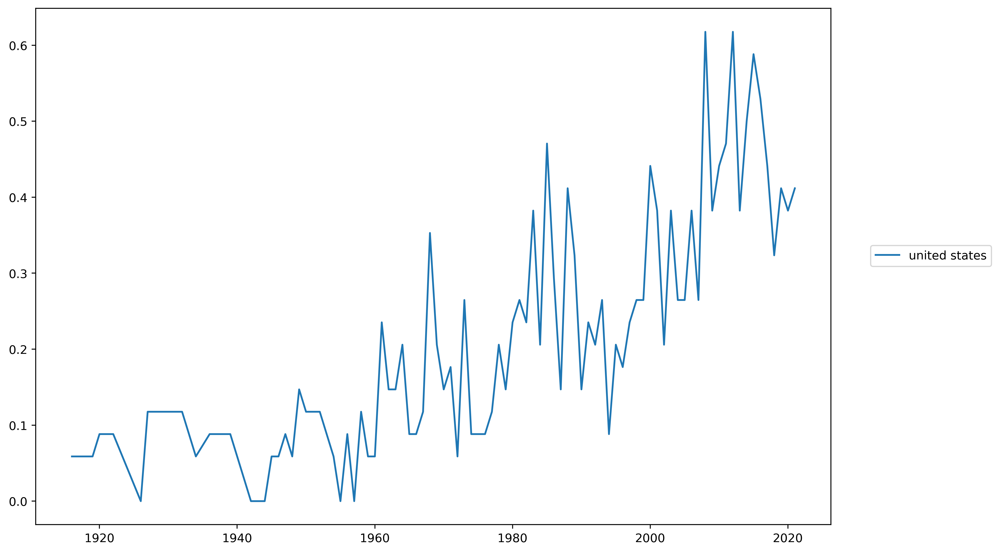

In [48]:
plt.figure(figsize=(12,8), dpi=400)
plt.plot(df_centrality_time_series['year'],df_centrality_time_series['united states'], label = "united states")
plt.legend(loc=(1.05,0.5))

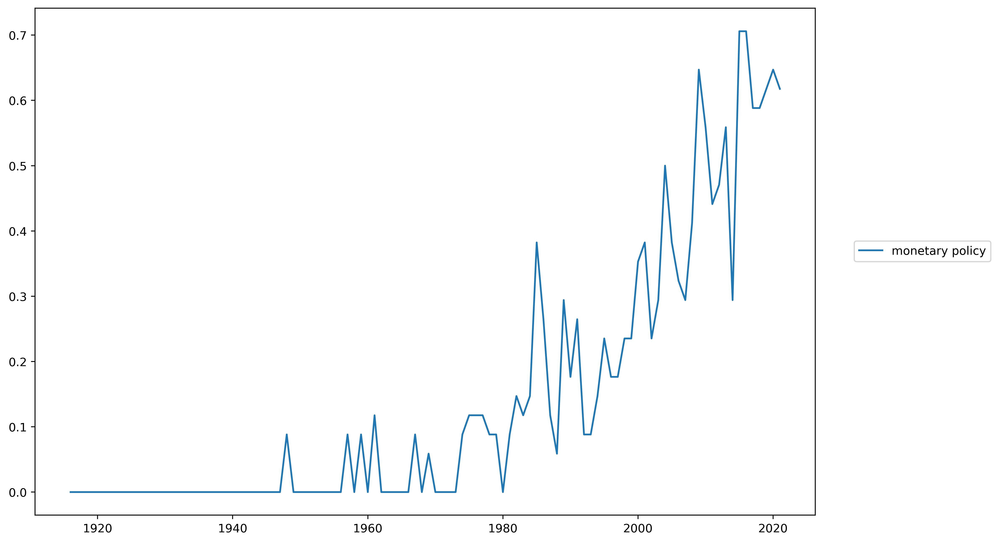

In [49]:
plt.figure(figsize=(12,8), dpi=400)
plt.plot(df_centrality_time_series['year'],df_centrality_time_series['monetary policy'], label = "monetary policy")
plt.legend(loc=(1.05,0.5))

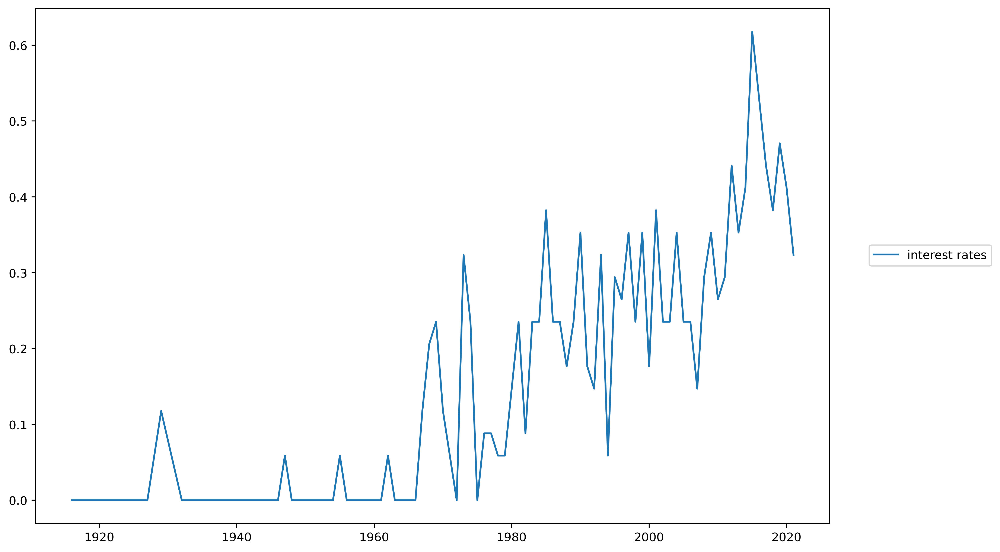

In [50]:
plt.figure(figsize=(12,8), dpi=400)
plt.plot(df_centrality_time_series['year'],df_centrality_time_series['interest rates'], label = "interest rates")
plt.legend(loc=(1.05,0.5))

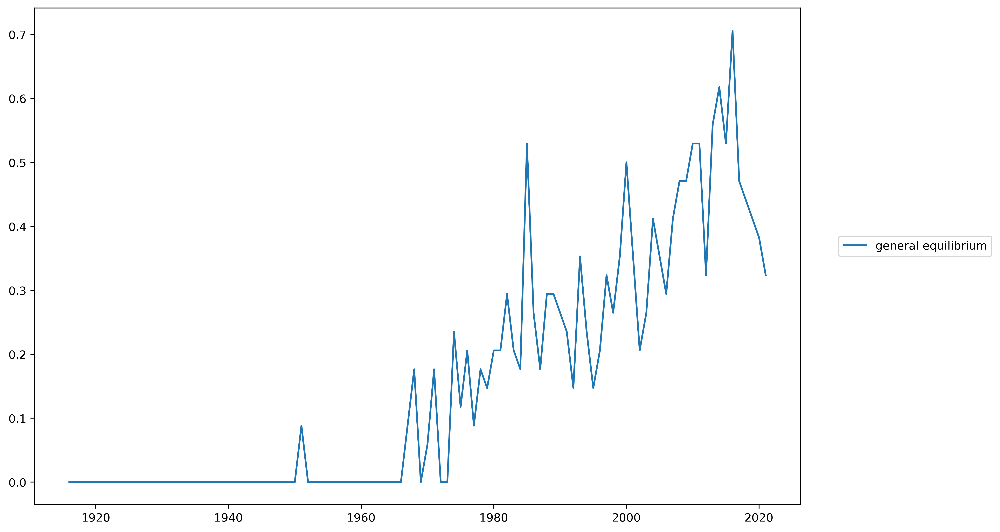

In [51]:
plt.figure(figsize=(12,8), dpi=400)
plt.plot(df_centrality_time_series['year'],df_centrality_time_series['general equilibrium'], label = "general equilibrium")
plt.legend(loc=(1.05,0.5))

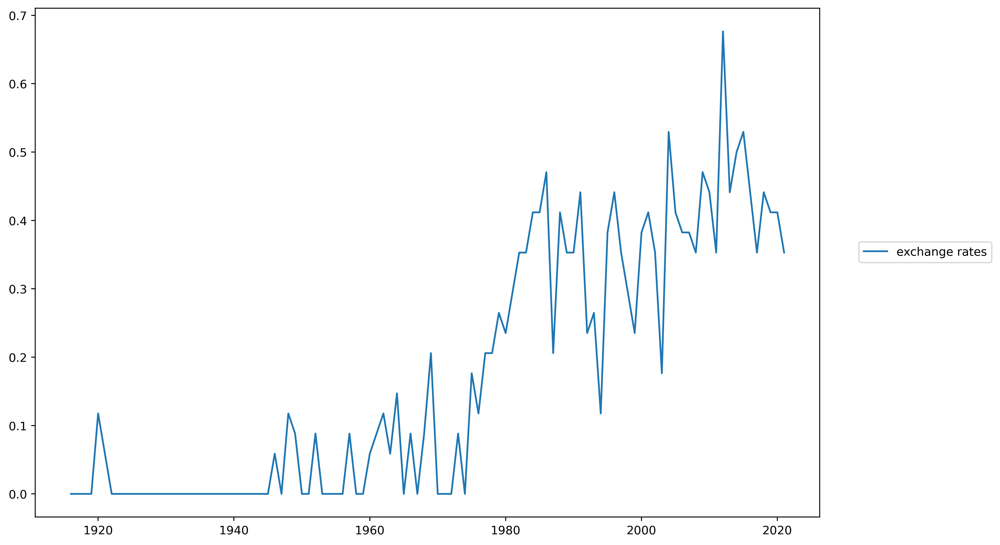

In [52]:
plt.figure(figsize=(12,8), dpi=400)
plt.plot(df_centrality_time_series['year'],df_centrality_time_series['exchange rates'], label = "exchange rates")
plt.legend(loc=(1.05,0.5))

In [53]:
df.to_csv('international_cleaned.csv')

<ipython-input-54-a24d40afe3e2>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12,8), dpi=400)


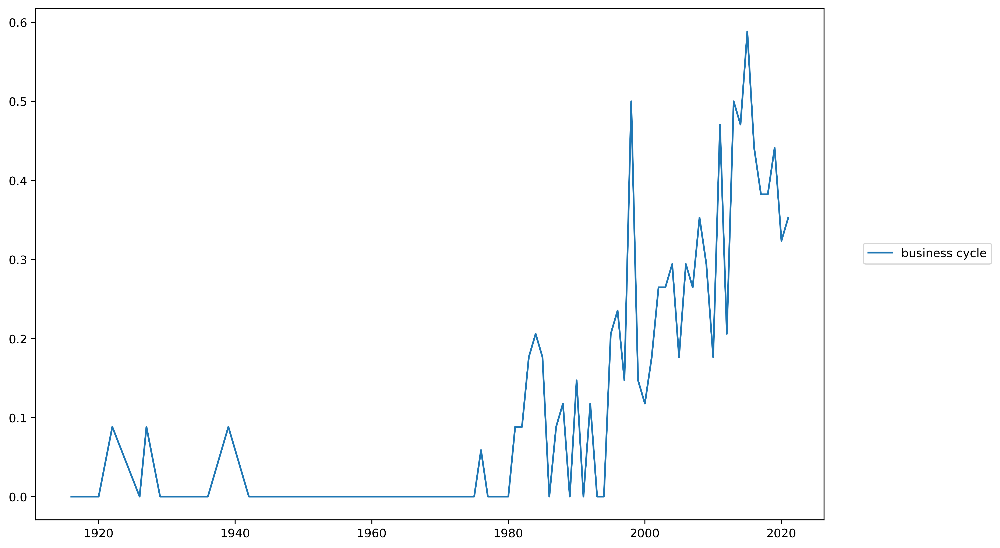

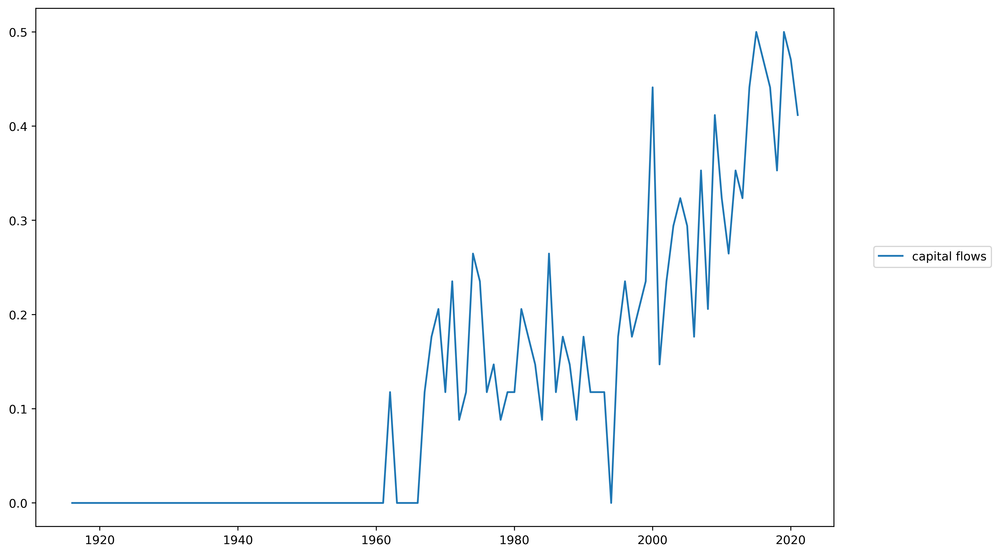

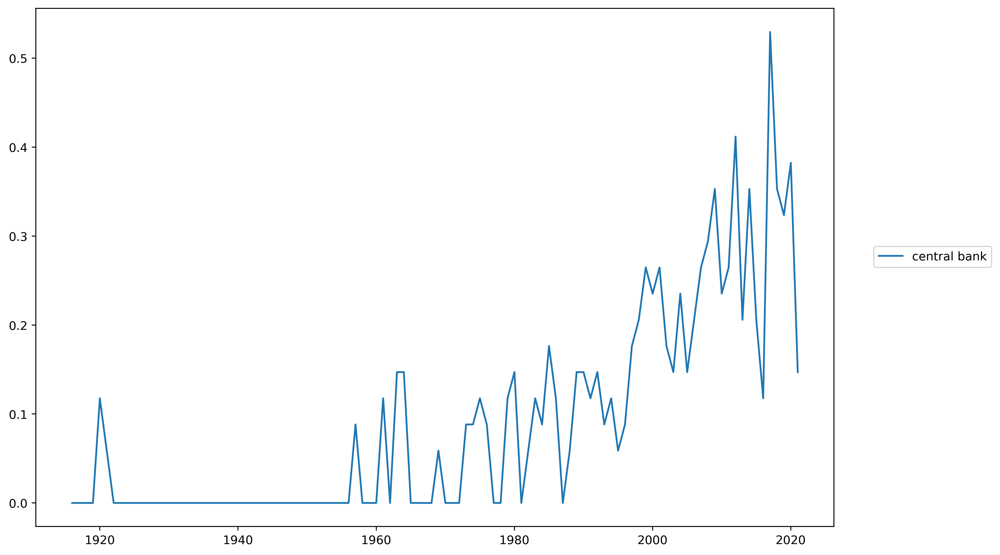

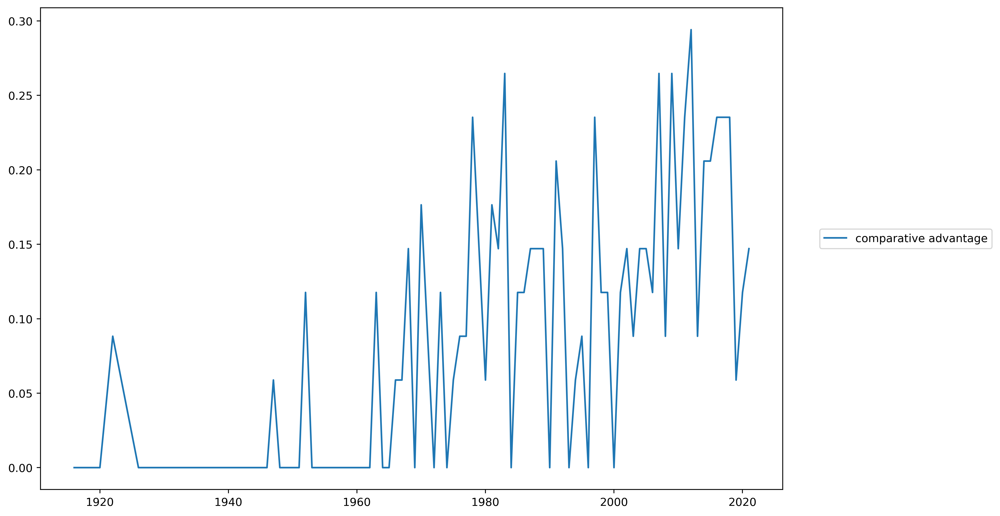

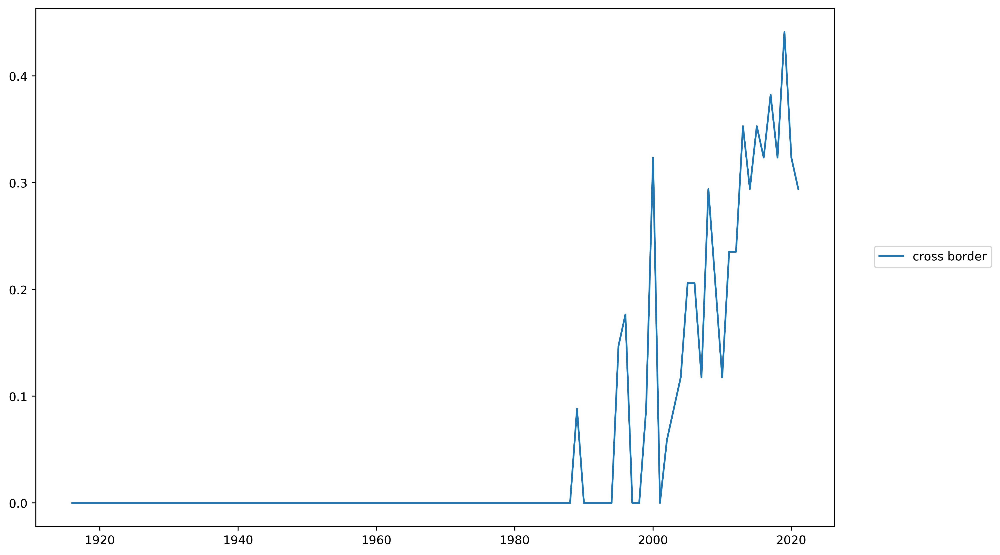

...

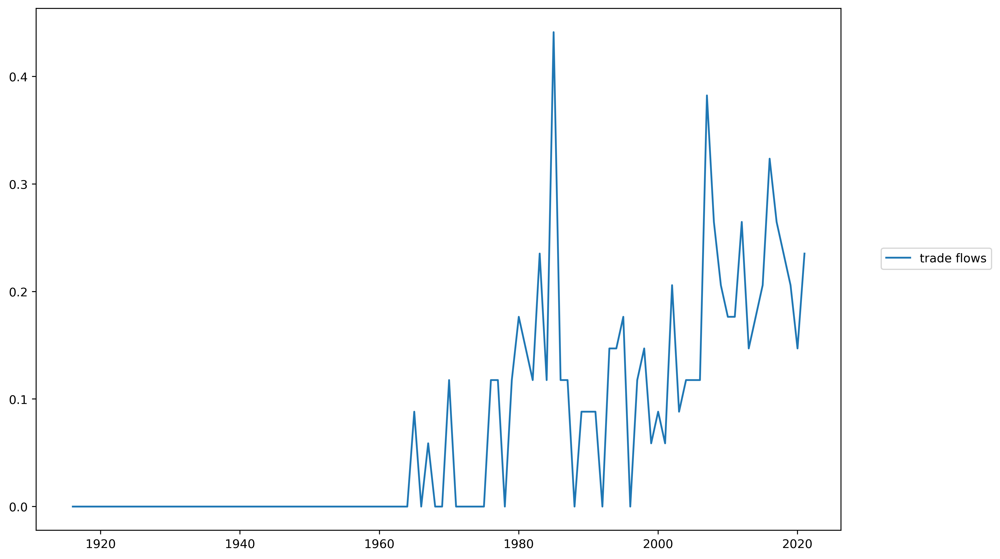

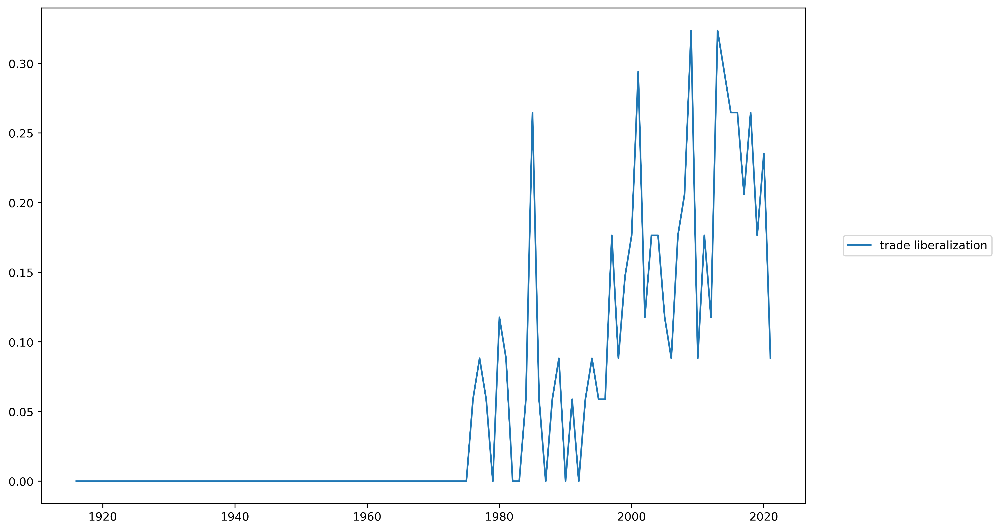

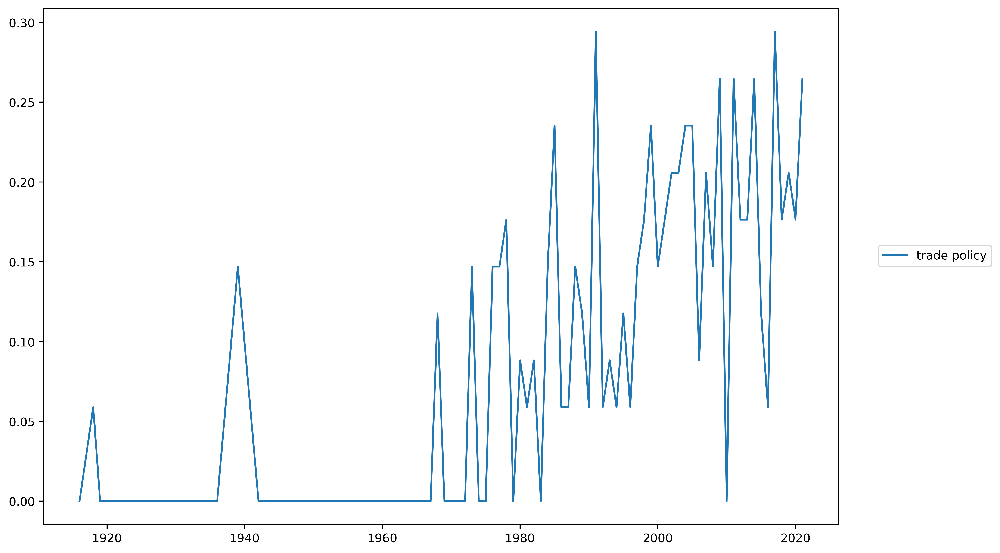

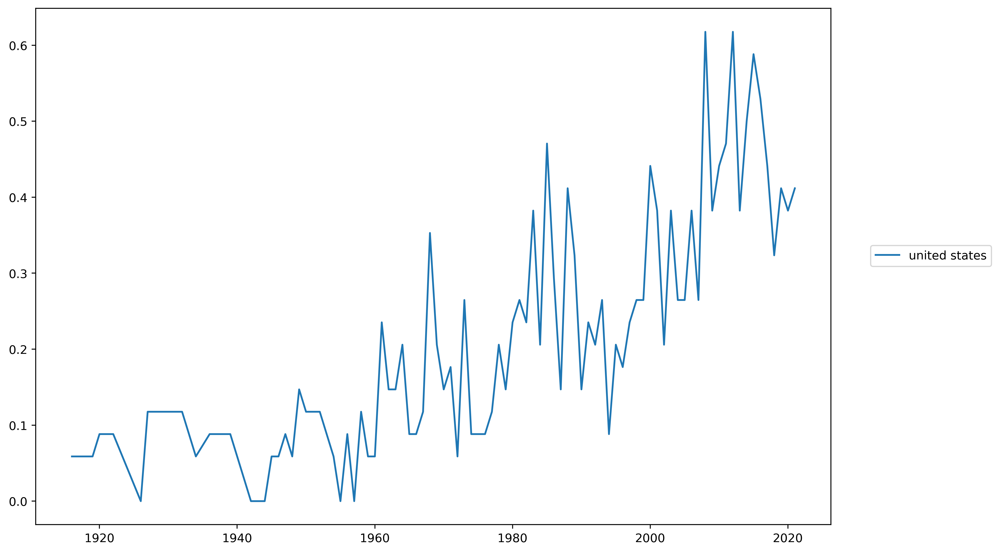

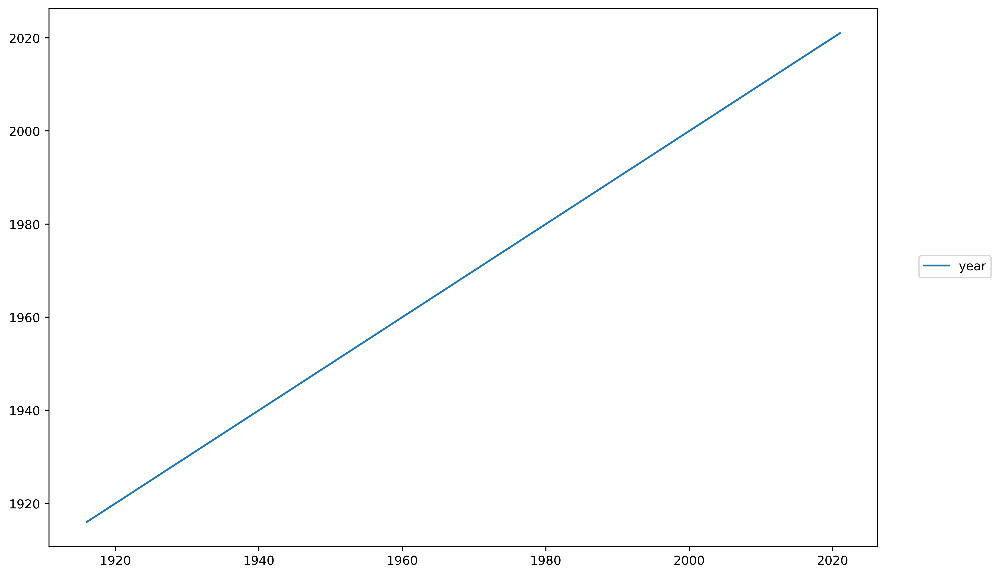

In [54]:
for feature in df_centrality_time_series:
    plt.figure(figsize=(12,8), dpi=400)
    plt.plot(df_centrality_time_series['year'],df_centrality_time_series[feature], label = feature)
    plt.legend(loc=(1.05,0.5))